In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import cv2
import numpy as np
import time
import random

In [ ]:
def sinusoidal_embedding(timesteps, embedding_dim=128):
    half_dim = embedding_dim // 2
    exponent = -tf.math.log(10000.0) / (half_dim - 1)
    embedding_basis = tf.exp(tf.range(half_dim, dtype=tf.float32) * exponent)
    timesteps_float = tf.cast(timesteps, dtype=tf.float32)
    embeddings = tf.concat([tf.sin(timesteps_float[:, None] * embedding_basis[None, :]),
                            tf.cos(timesteps_float[:, None] * embedding_basis[None, :])], axis=-1)
    return embeddings

def unet_block(input_tensor, num_filters):
    x = layers.Conv2D(num_filters, kernel_size=3, padding="same", activation="relu")(input_tensor)
    x = layers.Conv2D(num_filters, kernel_size=3, padding="same", activation="relu")(x)
    return x

def unet_model(input_shape, time_embedding_dim=128):
    inputs = keras.Input(shape=input_shape)
    time_input = keras.Input(shape=(time_embedding_dim,))

    # Encoder
    skip1 = unet_block(inputs, 128)
    time_proj1 = layers.Dense(128)(time_input)
    time_proj1_reshaped = layers.Reshape((1, 1, 128))(time_proj1)
    conv1_with_time = layers.Add()([skip1, time_proj1_reshaped])
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1_with_time)

    skip2 = unet_block(pool1, 256)
    time_proj2 = layers.Dense(256)(time_input)
    time_proj2_reshaped = layers.Reshape((1, 1, 256))(time_proj2)
    conv2_with_time = layers.Add()([skip2, time_proj2_reshaped])
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2_with_time)

    skip3 = unet_block(pool2, 512)
    time_proj3 = layers.Dense(512)(time_input)
    time_proj3_reshaped = layers.Reshape((1, 1, 512))(time_proj3)
    conv3_with_time = layers.Add()([skip3, time_proj3_reshaped])
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3_with_time)

    skip4 = unet_block(pool3, 1024)
    time_proj4 = layers.Dense(1024)(time_input)
    time_proj4_reshaped = layers.Reshape((1, 1, 1024))(time_proj4)
    conv4_with_time = layers.Add()([skip4, time_proj4_reshaped])
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4_with_time)

    conv5 = unet_block(pool4, 2048)

    up6 = layers.concatenate([layers.Conv2DTranspose(1024, kernel_size=2, strides=(2, 2), padding="same")(conv5), skip4], axis=-1)
    conv6 = unet_block(up6, 1024)

    up7 = layers.concatenate([layers.Conv2DTranspose(512, kernel_size=2, strides=(2, 2), padding="same")(conv6), skip3], axis=-1)
    conv7 = unet_block(up7, 512)

    up8 = layers.concatenate([layers.Conv2DTranspose(256, kernel_size=2, strides=(2, 2), padding="same")(conv7), skip2], axis=-1)
    conv8 = unet_block(up8, 256)

    up9 = layers.concatenate([layers.Conv2DTranspose(128, kernel_size=2, strides=(2, 2), padding="same")(conv8), skip1], axis=-1)
    conv9 = unet_block(up9, 128)

    outputs = layers.Conv2D(3, kernel_size=1, activation="linear")(conv9) # Assuming output is an image

    model = keras.Model(inputs=[inputs, time_input], outputs=outputs)

    return model

In [ ]:
def cosine_beta_schedule(timesteps, s=0.008):
    steps = timesteps + 1
    x = tf.linspace(0.0, timesteps, steps)
    alphas_cumprod = tf.cos(((x / timesteps) + s) / (1 + s) * tf.constant(np.pi) * 0.5)**2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return tf.clip_by_value(betas, 0.0001, 0.9999)

def add_noise(image, timestep, sqrt_alphas_cumprod, sqrt_one_minus_alpha_cumprod):
    sqrt_alphas_cumprod_t = tf.gather(sqrt_alphas_cumprod, timestep)
    sqrt_alphas_cumprod_t = tf.reshape(sqrt_alphas_cumprod_t, [-1, 1, 1, 1])

    sqrt_one_minus_alphas_cumprod_t = tf.gather(sqrt_one_minus_alphas_cumprod, timestep)
    sqrt_one_minus_alphas_cumprod_t = tf.reshape(sqrt_one_minus_alphas_cumprod_t, [-1, 1, 1, 1])

    noise = tf.random.normal(shape=tf.shape(image))
    noisy_image = sqrt_alphas_cumprod_t * image + sqrt_one_minus_alphas_cumprod_t * noise
    return noisy_image, noise

In [ ]:
def compress_and_save_images(hr_dir, output_base_dir, quality_levels, scale_factor=4):
    if not os.path.exists(output_base_dir):
        os.makedirs(output_base_dir)
        print(f"Created output directory: {output_base_dir}")

    hr_image_paths = sorted([
        os.path.join(hr_dir, f) for f in os.listdir(hr_dir)
        if f.lower().endswith('.png')
    ])

    if not hr_image_paths:
        print(f"No PNG images found in {hr_dir}. Please check the directory and file extensions.")
        return

    print(f"Found {len(hr_image_paths)} HR images.")

    for hr_path in hr_image_paths:
        filename = os.path.basename(hr_path)
        name, _ = os.path.splitext(filename)

        hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR)

        if hr_img is None:
            print(f"Warning: Could not read image {hr_path}. Skipping.")
            continue

        new_w = hr_img.shape[1] // scale_factor
        new_h = hr_img.shape[0] // scale_factor

        lr_img = cv2.resize(hr_img, (new_w, new_h), interpolation=cv2.INTER_CUBIC)

        for quality in quality_levels:
            quality_output_dir = os.path.join(output_base_dir, str(quality))
            if not os.path.exists(quality_output_dir):
                os.makedirs(quality_output_dir)

            output_filename = f"{name}_q{quality}.jpg"
            output_path = os.path.join(quality_output_dir, output_filename)

            success = cv2.imwrite(output_path, lr_img, [int(cv2.IMWRITE_JPEG_QUALITY), quality])

            if success:
                print(f"Compressed {filename} at quality {quality} and saved to {output_path}")
            else:
                print(f"Error compressing {filename} at quality {quality}.")

    print("Compression process finished.")

In [ ]:
#rm -r /content/compressed_div2k_val brisanje direktorija i njegovih sadržaja ako dođe do greške u
# idućem bloku komandi

In [ ]:
hr_image_train_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_train_HR'
hr_image_val_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_valid_HR'
hr_image_test_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_test_HR'
compressed_output_train_dir = '/content/compressed_div2k_train'
compressed_output_val_dir = '/content/compressed_div2k_val'
compressed_output_test_dir = '/content/compressed_div2k_test'
compression_quality_levels = [10, 30, 50]

compress_and_save_images(hr_image_train_dir, compressed_output_train_dir, compression_quality_levels)
compress_and_save_images(hr_image_val_dir, compressed_output_val_dir, compression_quality_levels)
compress_and_save_images(hr_image_test_dir, compressed_output_test_dir, compression_quality_levels)

Created output directory: /content/compressed_div2k_train
Found 700 HR images.
Compressed 0001.png at quality 10 and saved to /content/compressed_div2k_train/10/0001_q10.jpg
Compressed 0001.png at quality 30 and saved to /content/compressed_div2k_train/30/0001_q30.jpg
Compressed 0001.png at quality 50 and saved to /content/compressed_div2k_train/50/0001_q50.jpg
Compressed 0002.png at quality 10 and saved to /content/compressed_div2k_train/10/0002_q10.jpg
Compressed 0002.png at quality 30 and saved to /content/compressed_div2k_train/30/0002_q30.jpg
Compressed 0002.png at quality 50 and saved to /content/compressed_div2k_train/50/0002_q50.jpg
Compressed 0003.png at quality 10 and saved to /content/compressed_div2k_train/10/0003_q10.jpg
Compressed 0003.png at quality 30 and saved to /content/compressed_div2k_train/30/0003_q30.jpg
Compressed 0003.png at quality 50 and saved to /content/compressed_div2k_train/50/0003_q50.jpg
Compressed 0004.png at quality 10 and saved to /content/compressed

In [ ]:
def concatenate_lr_noisy_hr(lr_images, noisy_hr_images):
    return tf.concat([
        tf.image.resize(lr_images, tf.shape(noisy_hr_images)[1:3]),
        noisy_hr_images
    ], axis=-1)

In [ ]:
def create_dataset(hr_dir, lr_dir, quality_levels, hr_patch_size=256, scale_factor=4, batch_size=16):
    hr_image_paths = sorted([os.path.join(hr_dir, f) for f in os.listdir(hr_dir)])

    dataset_pairs = []
    for hr_path in hr_image_paths:
        filename = os.path.basename(hr_path)
        name, _ = os.path.splitext(filename)
        # Odabirem samo jednu razinu kompresije nasumično za skupa podataka
        quality = random.choice(quality_levels)
        lr_filename = f"{name}_q{quality}.jpg"
        lr_path = os.path.join(lr_dir, str(quality), lr_filename)
        if os.path.exists(lr_path):
            dataset_pairs.append((hr_path, lr_path))

    if not dataset_pairs:
      raise ValueError("No valid hr-lr image pairs found.")

    hr_paths, lr_paths = zip(*dataset_pairs)
    path_dataset = tf.data.Dataset.from_tensor_slices((list(hr_paths), list(lr_paths)))

    def process_path(hr_path, lr_path):
        hr_img = tf.io.read_file(hr_path)
        hr_img = tf.image.decode_png(hr_img, channels=3)
        hr_img = tf.image.convert_image_dtype(hr_img, tf.float32)

        lr_img = tf.io.read_file(lr_path)
        lr_img = tf.image.decode_jpeg(lr_img, channels=3)
        lr_img = tf.image.convert_image_dtype(lr_img, tf.float32)

        hr_crop_size = hr_patch_size
        lr_crop_size = hr_crop_size // scale_factor

        hr_shape = tf.shape(hr_img)[:2]
        lr_shape = tf.shape(lr_img)[:2]

        lr_max_x = lr_shape[1] - lr_crop_size
        lr_max_y = lr_shape[0] - lr_crop_size
        lr_x = tf.random.uniform([], 0, lr_max_x + 1, dtype=tf.int32)
        lr_y = tf.random.uniform([], 0, lr_max_y + 1, dtype=tf.int32)

        lr_patch = tf.image.crop_to_bounding_box(lr_img, lr_y, lr_x, lr_crop_size, lr_crop_size)

        hr_x = lr_x * scale_factor
        hr_y = lr_y * scale_factor

        hr_patch = tf.image.crop_to_bounding_box(hr_img, hr_y, hr_x, hr_crop_size, hr_crop_size)

        lr_patch_up = tf.image.resize(lr_patch, [hr_crop_size, hr_crop_size], method='bicubic')

        return lr_patch_up, hr_patch

    dataset = path_dataset.shuffle(buffer_size=len(dataset_pairs)).map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [ ]:
@tf.function
def train_step(hr_batch, lr_batch, model, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    batch_size = tf.shape(hr_batch)[0]

    t = tf.random.uniform(shape=[batch_size], minval=0, maxval=timesteps, dtype=tf.int32)

    noisy_hr_batch, noise = add_noise(hr_batch, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

    lr_up = tf.image.resize(lr_batch, tf.shape(hr_batch)[1:3], method="bicubic")

    model_input = concatenate_lr_noisy_hr(lr_up, noisy_hr_batch)

    time_embeddings = sinusoidal_embedding(t)

    with tf.GradientTape() as tape:
        predicted_noise = model([model_input, time_embeddings], training=True)
        loss = loss_fn(noise, predicted_noise)

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return loss

In [ ]:
@tf.function
def validation_step(hr_batch, lr_batch, model, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    batch_size = tf.shape(hr_batch)[0]

    t = tf.random.uniform(shape=[batch_size], minval=0, maxval=timesteps, dtype=tf.int32)

    noisy_hr_batch, noise = add_noise(hr_batch, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

    model_image_input = concatenate_lr_noisy_hr(lr_batch, noisy_hr_batch)

    time_embeddings = sinusoidal_embedding(t)

    predicted_noise = model([model_image_input, time_embeddings], training=False)
    val_loss = loss_fn(noise, predicted_noise)

    return val_loss

In [ ]:
@tf.function
def init_optimizer(model, optimizer):
    dummy_hr = tf.zeros((1, hr_patch_size, hr_patch_size, 3))
    dummy_lr = tf.zeros((1, hr_patch_size // scale_factor, hr_patch_size // scale_factor, 3))
    t = tf.constant([0])
    noisy_hr, noise = add_noise(dummy_hr, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    lr_up = tf.image.resize(dummy_lr, (hr_patch_size, hr_patch_size), method="bicubic")
    model_input = concatenate_lr_noisy_hr(lr_up, noisy_hr)
    time_emb = sinusoidal_embedding(t)

    with tf.GradientTape() as tape:
        predicted = model([model_input, time_emb], training=True)
        loss = loss_fn(noise, predicted)

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [ ]:
def sample(lr_image, model, timesteps=1000, sampling_steps=None):
    if len(tf.shape(lr_image)) == 3:
        lr_image = tf.expand_dims(lr_image, axis=0)

    batch_size = tf.shape(lr_image)[0]
    height, width, channels = tf.shape(lr_image)[1], tf.shape(lr_image)[2], tf.shape(lr_image)[3]

    x_t = tf.random.normal(shape=(batch_size, height, width, channels))

    if sampling_steps is None:
        sampling_steps = timesteps
    sample_timesteps = np.linspace(timesteps - 1, 0, sampling_steps, dtype=np.int32)

    betas = cosine_beta_schedule(timesteps)
    alphas = 1.0 - betas
    alphas_cumprod = tf.math.cumprod(alphas, axis=0)
    alphas_cumprod_prev = tf.concat([tf.constant([1.0], dtype=tf.float32), alphas_cumprod[:-1]], axis=0)

    for i, t in enumerate(sample_timesteps):
        t_batch = tf.fill([batch_size], t)

        model_image_input = concatenate_lr_noisy_hr(lr_image, x_t)
        time_embeddings = sinusoidal_embedding(t_batch)

        predicted_noise = model([model_image_input, time_embeddings], training=False)

        alpha_t = tf.reshape(alphas[t], [-1, 1, 1, 1])
        alpha_cumprod_t = tf.reshape(alphas_cumprod[t], [-1, 1, 1, 1])
        alpha_cumprod_prev_t = tf.reshape(alphas_cumprod_prev[t], [-1, 1, 1, 1])
        beta_t = tf.reshape(betas[t], [-1, 1, 1, 1])

        mean = (x_t - beta_t * predicted_noise / tf.math.sqrt(1.0 - alpha_cumprod_t)) / tf.math.sqrt(alpha_t)

        if t > 0:
            variance = (1.0 - alpha_cumprod_prev_t) / (1.0 - alpha_cumprod_t) * beta_t
            log_variance = tf.math.log(variance) if i == 0 else tf.math.log(beta_t)

            noise = tf.random.normal(shape=tf.shape(x_t))
            x_t = mean + tf.math.exp(0.5 * log_variance) * noise
        else:
            x_t = mean

        x_t = tf.clip_by_value(x_t, 0.0, 1.0)

    return x_t

In [ ]:
def visualize_sample(model, dataset, timesteps, epoch=None, save_dir=None, num_samples=3):
    all_psnr, all_ssim = [], []

    for lr_batch, hr_batch in dataset.take(1):
        for i in range(min(num_samples, lr_batch.shape[0])):
            lr_img = lr_batch[i:i+1]
            hr_img = hr_batch[i:i+1]
            sample_output = sample(lr_img, model, timesteps)

            lr_img_np = tf.squeeze(lr_img).numpy()
            sr_img_np = tf.squeeze(sample_output).numpy()
            hr_img_np = tf.squeeze(hr_img).numpy()

            psnr_val = tf.image.psnr(sr_img_np, hr_img_np, max_val=1.0)
            ssim_val = tf.image.ssim(sr_img_np, hr_img_np, max_val=1.0)
            all_psnr.append(psnr_val.numpy())
            all_ssim.append(ssim_val.numpy())

            #Plotting
            plt.figure(figsize=(12, 4))
            titles = ['LR Input', 'SR Output', 'HR Ground Truth']
            images = [lr_img_np, sr_img_np, hr_img_np]
            for j in range(3):
                plt.subplot(1, 3, j + 1)
                plt.imshow(np.clip(images[j], 0, 1))
                plt.title(titles[j])
                plt.axis('off')
            plt.tight_layout()

            if save_dir and epoch is not None:
                os.makedirs(save_dir, exist_ok=True)
                image_path = os.path.join(save_dir, f"epoch_{epoch+1}_sample_{i+1}.png")
                plt.savefig(image_path)
                print(f"Saved visualization: {image_path}")

            plt.show()

    mean_psrn = np.mean(all_psnr)
    mean_ssim = np.mean(all_ssim)
    print(f"Metrics for epoch: {epoch + 1} Mean PSNR: {mean_psrn}, Mean SSIM: {mean_ssim}")

In [ ]:
# --- Main Training Loop Setup ---
train_hr_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_train_HR'
compressed_train_dir = '/content/compressed_div2k_train'
valid_hr_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_valid_HR'
compressed_valid_dir = '/content/compressed_div2k_val'
test_hr_dir = '/content/drive/MyDrive/Datasets/Dataset/DIV2K_test_HR'
compressed_test_dir = '/content/compressed_div2k_test'

quality_levels = [10, 30, 50]
hr_patch_size = 256
scale_factor = 4
batch_size = 32
timesteps = 1000
epochs = 100
steps_per_epoch = 1000 # Since the dataset repeats, define a fixed number of steps

betas = cosine_beta_schedule(timesteps)
alphas = 1.0 - betas
alphas_cumprod = tf.math.cumprod(alphas, axis=0)
sqrt_alphas_cumprod = tf.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = tf.sqrt(1.0 - alphas_cumprod)

train_dataset = create_dataset(train_hr_dir, compressed_train_dir, quality_levels, hr_patch_size, scale_factor, batch_size)
valid_dataset = create_dataset(valid_hr_dir, compressed_valid_dir, quality_levels, hr_patch_size, scale_factor, batch_size)
test_dataset = create_dataset(test_hr_dir, compressed_test_dir, quality_levels, hr_patch_size, scale_factor, batch_size)

input_channels = 3 + 3
model = unet_model(input_shape=(hr_patch_size, hr_patch_size, input_channels))

dummy_input = tf.zeros((1, hr_patch_size, hr_patch_size, input_channels))
dummy_t = tf.constant([0])
dummy_time_embedding = sinusoidal_embedding(dummy_t)
_ = model([dummy_input, dummy_time_embedding])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
loss_fn = tf.keras.losses.MeanSquaredError()

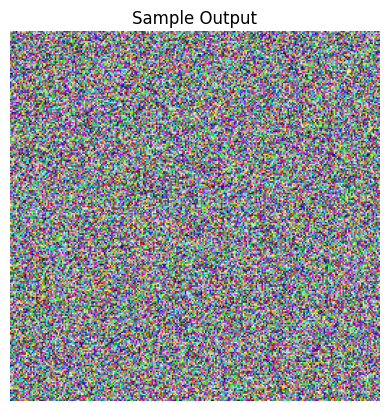

In [ ]:
# Testiranje sample funkcije kako ne bi morao trenirati nekoliko epoha svaki put prije errora

for lr, hr in train_dataset.take(1):
    test_lr_image = lr[0:1]

test_sample = sample(test_lr_image, model, timesteps=1000, sampling_steps=50)

plt.imshow(tf.squeeze(test_sample).numpy())
plt.title("Sample Output")
plt.axis("off")
plt.show()

In [ ]:
# Zbog @tf.function nije moguće runat dva puta po runtime-u zato je u zasebnom bloku
init_optimizer(model, optimizer)

Starting training...


Epoch 1/100 | Train Loss: 0.0089 | Val Loss: 0.0093 | PSNR: 8.38 | SSIM: 0.0121


Epoch 2/100 | Train Loss: 0.0047 | Val Loss: 0.0061 | PSNR: 8.62 | SSIM: 0.0133


Epoch 3/100 | Train Loss: 0.0034 | Val Loss: 0.0047 | PSNR: 8.81 | SSIM: 0.0151


Epoch 4/100 | Train Loss: 0.0025 | Val Loss: 0.0038 | PSNR: 9.02 | SSIM: 0.0166


Epoch 5/100 | Train Loss: 0.0024 | Val Loss: 0.0027 | PSNR: 9.10 | SSIM: 0.0162


Epoch 6/100 | Train Loss: 0.0023 | Val Loss: 0.0029 | PSNR: 9.10 | SSIM: 0.0178


Epoch 7/100 | Train Loss: 0.0021 | Val Loss: 0.0028 | PSNR: 9.24 | SSIM: 0.0188


Epoch 8/100 | Train Loss: 0.0019 | Val Loss: 0.0033 | PSNR: 9.27 | SSIM: 0.0181


Epoch 9/100 | Train Loss: 0.0020 | Val Loss: 0.0033 | PSNR: 9.36 | SSIM: 0.0190


Epoch 10/100 | Train Loss: 0.0019 | Val Loss: 0.0025 | PSNR: 9.34 | SSIM: 0.0199
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_10_sample_1.png


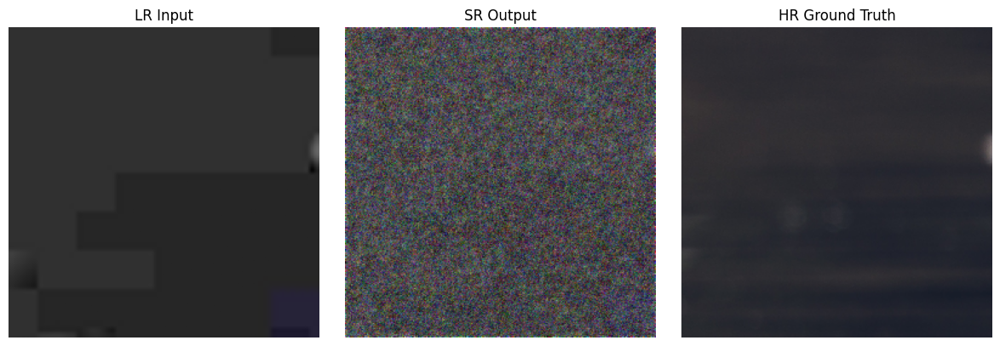

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_10_sample_2.png


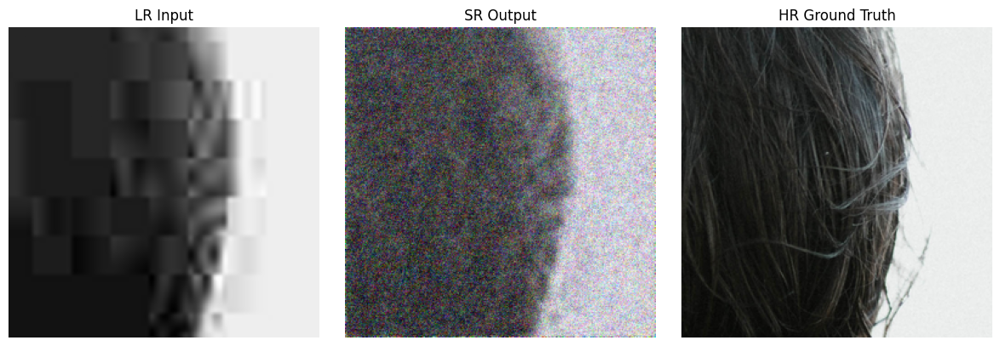

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_10_sample_3.png


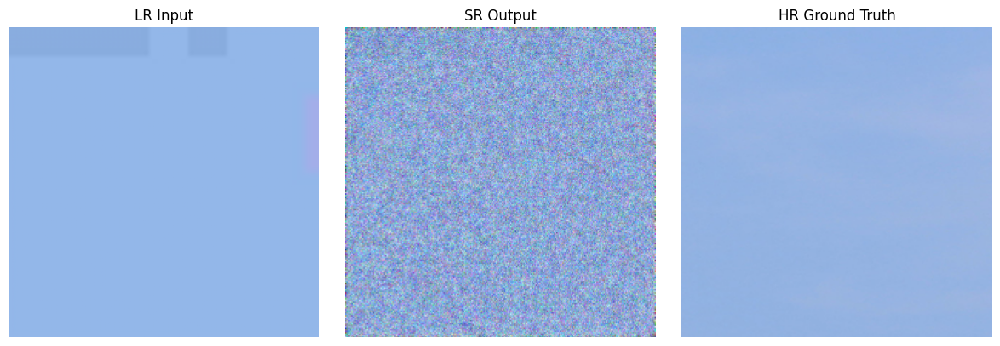

Metrics for epoch: 10 Mean PSNR: 17.092084884643555, Mean SSIM: 0.10169649124145508
Saved model weights at epoch 10


Epoch 11/100 | Train Loss: 0.0019 | Val Loss: 0.0039 | PSNR: 9.24 | SSIM: 0.0199


Epoch 12/100 | Train Loss: 0.0017 | Val Loss: 0.0038 | PSNR: 9.40 | SSIM: 0.0202


Epoch 13/100 | Train Loss: 0.0015 | Val Loss: 0.0023 | PSNR: 9.42 | SSIM: 0.0204


Epoch 14/100 | Train Loss: 0.0016 | Val Loss: 0.0017 | PSNR: 9.45 | SSIM: 0.0202


Epoch 15/100 | Train Loss: 0.0017 | Val Loss: 0.0036 | PSNR: 9.41 | SSIM: 0.0200


Epoch 16/100 | Train Loss: 0.0016 | Val Loss: 0.0025 | PSNR: 9.62 | SSIM: 0.0216


Epoch 17/100 | Train Loss: 0.0015 | Val Loss: 0.0019 | PSNR: 9.63 | SSIM: 0.0201


Epoch 18/100 | Train Loss: 0.0015 | Val Loss: 0.0017 | PSNR: 9.49 | SSIM: 0.0195


Epoch 19/100 | Train Loss: 0.0014 | Val Loss: 0.0024 | PSNR: 9.55 | SSIM: 0.0205


Epoch 20/100 | Train Loss: 0.0014 | Val Loss: 0.0031 | PSNR: 9.47 | SSIM: 0.0211
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_20_sample_1.png


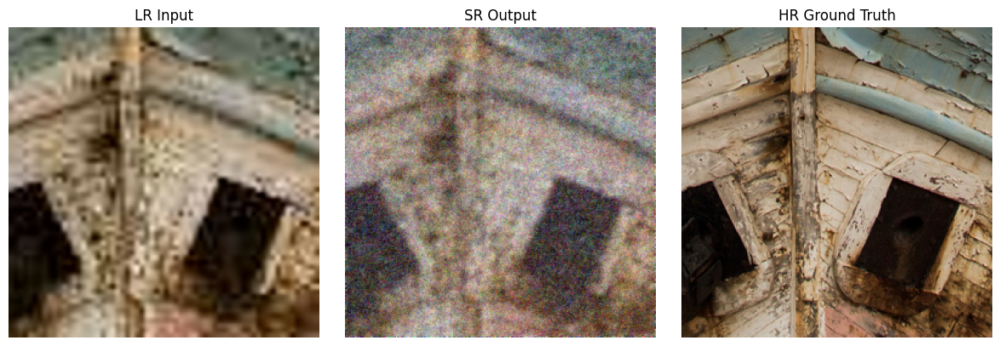

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_20_sample_2.png


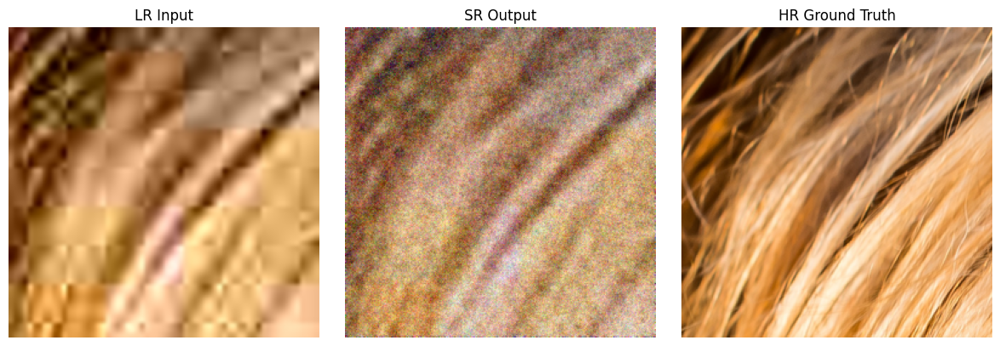

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_20_sample_3.png


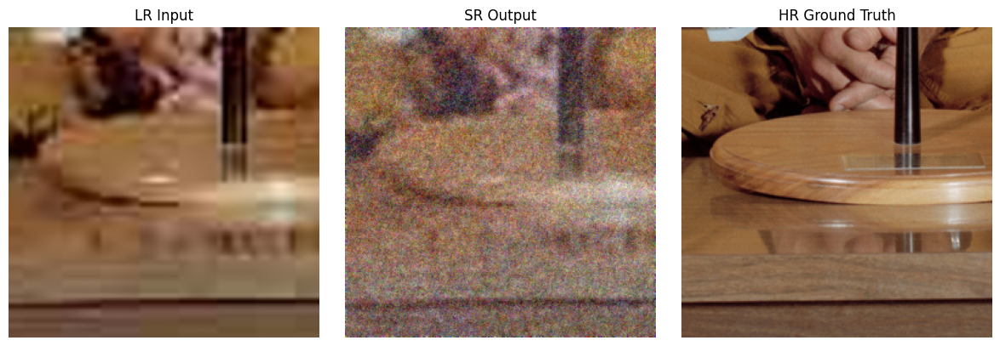

Metrics for epoch: 20 Mean PSNR: 17.35171890258789, Mean SSIM: 0.19953308999538422
Saved model weights at epoch 20


Epoch 21/100 | Train Loss: 0.0013 | Val Loss: 0.0025 | PSNR: 9.46 | SSIM: 0.0213


Epoch 22/100 | Train Loss: 0.0013 | Val Loss: 0.0023 | PSNR: 9.63 | SSIM: 0.0222


Epoch 23/100 | Train Loss: 0.0015 | Val Loss: 0.0016 | PSNR: 9.48 | SSIM: 0.0208


Epoch 24/100 | Train Loss: 0.0011 | Val Loss: 0.0018 | PSNR: 9.55 | SSIM: 0.0224


Epoch 25/100 | Train Loss: 0.0013 | Val Loss: 0.0016 | PSNR: 9.44 | SSIM: 0.0224


Epoch 26/100 | Train Loss: 0.0012 | Val Loss: 0.0024 | PSNR: 9.60 | SSIM: 0.0220


Epoch 27/100 | Train Loss: 0.0013 | Val Loss: 0.0021 | PSNR: 9.80 | SSIM: 0.0217


Epoch 28/100 | Train Loss: 0.0011 | Val Loss: 0.0024 | PSNR: 9.42 | SSIM: 0.0225


Epoch 29/100 | Train Loss: 0.0012 | Val Loss: 0.0028 | PSNR: 9.62 | SSIM: 0.0214


Epoch 30/100 | Train Loss: 0.0013 | Val Loss: 0.0016 | PSNR: 9.74 | SSIM: 0.0224
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_30_sample_1.png


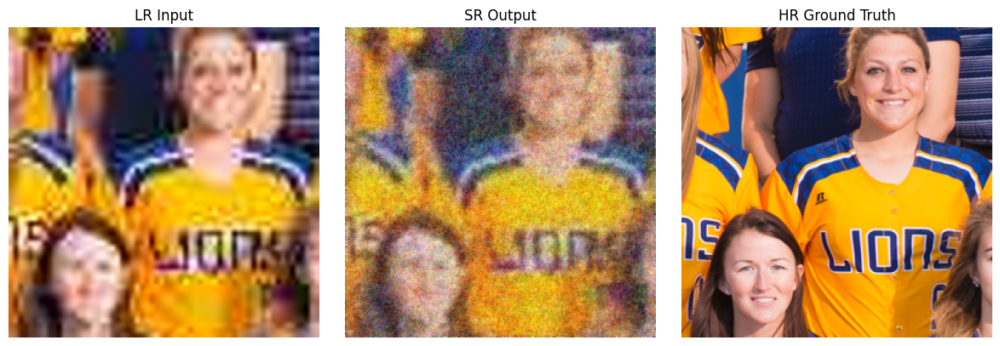

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_30_sample_2.png


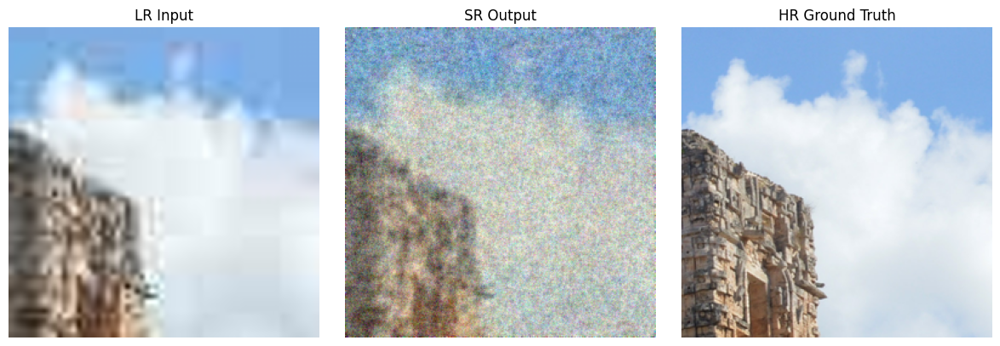

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_30_sample_3.png


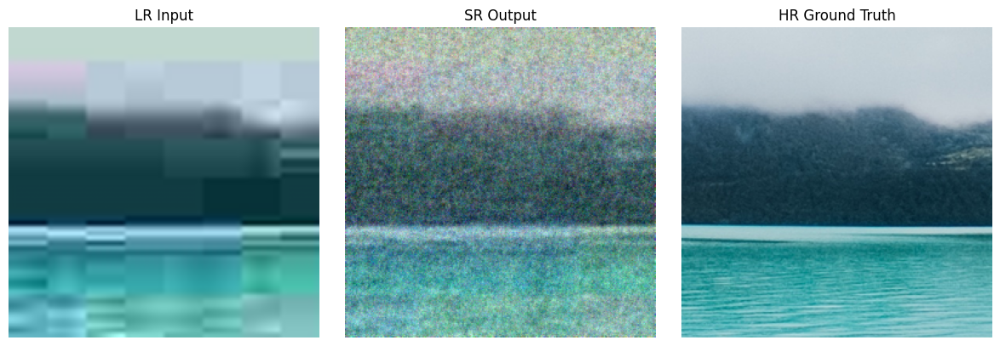

Metrics for epoch: 30 Mean PSNR: 16.7591552734375, Mean SSIM: 0.21074073016643524
Saved model weights at epoch 30


Epoch 31/100 | Train Loss: 0.0011 | Val Loss: 0.0019 | PSNR: 9.82 | SSIM: 0.0247


Epoch 32/100 | Train Loss: 0.0011 | Val Loss: 0.0020 | PSNR: 9.66 | SSIM: 0.0221


Epoch 33/100 | Train Loss: 0.0013 | Val Loss: 0.0026 | PSNR: 9.72 | SSIM: 0.0221


Epoch 34/100 | Train Loss: 0.0011 | Val Loss: 0.0017 | PSNR: 9.79 | SSIM: 0.0235


Epoch 35/100 | Train Loss: 0.0011 | Val Loss: 0.0014 | PSNR: 9.68 | SSIM: 0.0232


Epoch 36/100 | Train Loss: 0.0012 | Val Loss: 0.0013 | PSNR: 9.58 | SSIM: 0.0234


Epoch 37/100 | Train Loss: 0.0012 | Val Loss: 0.0034 | PSNR: 9.66 | SSIM: 0.0225


Epoch 38/100 | Train Loss: 0.0013 | Val Loss: 0.0015 | PSNR: 9.74 | SSIM: 0.0226


Epoch 39/100 | Train Loss: 0.0012 | Val Loss: 0.0023 | PSNR: 9.69 | SSIM: 0.0234


Epoch 40/100 | Train Loss: 0.0013 | Val Loss: 0.0020 | PSNR: 9.76 | SSIM: 0.0227
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_40_sample_1.png


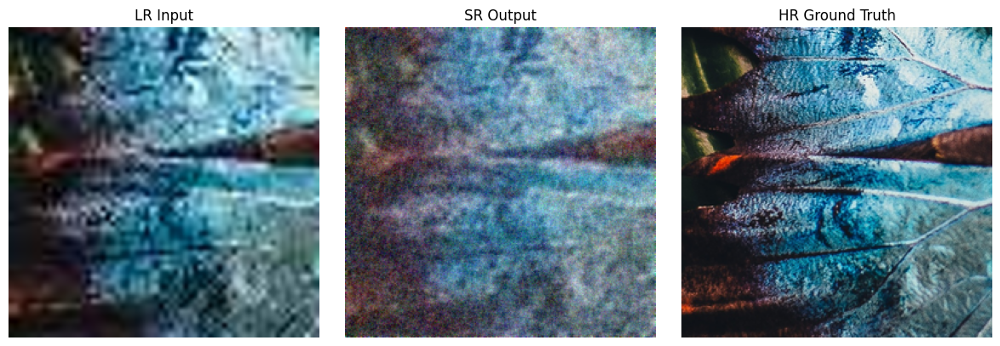

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_40_sample_2.png


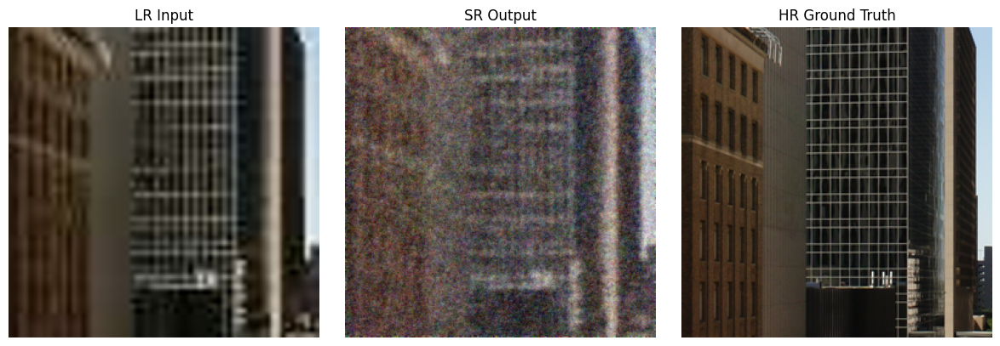

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_40_sample_3.png


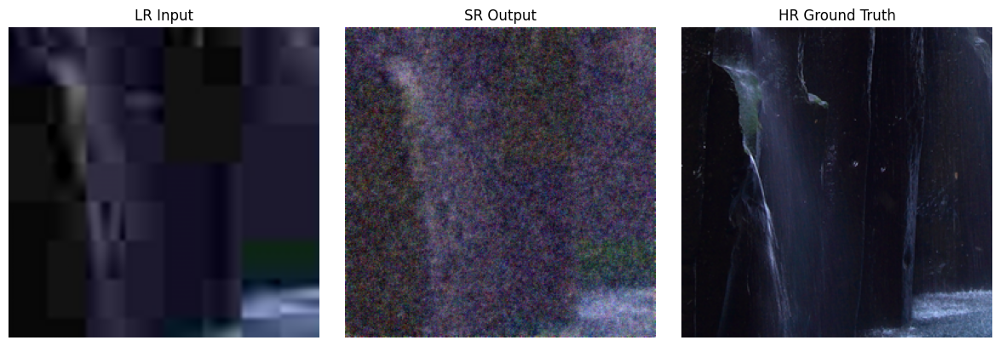

Metrics for epoch: 40 Mean PSNR: 16.290830612182617, Mean SSIM: 0.19067473709583282
Saved model weights at epoch 40


Epoch 41/100 | Train Loss: 0.0010 | Val Loss: 0.0016 | PSNR: 9.60 | SSIM: 0.0219


Epoch 42/100 | Train Loss: 0.0011 | Val Loss: 0.0018 | PSNR: 9.65 | SSIM: 0.0226


Epoch 43/100 | Train Loss: 0.0010 | Val Loss: 0.0016 | PSNR: 9.50 | SSIM: 0.0222


Epoch 44/100 | Train Loss: 0.0010 | Val Loss: 0.0052 | PSNR: 9.69 | SSIM: 0.0230


Epoch 45/100 | Train Loss: 0.0011 | Val Loss: 0.0016 | PSNR: 9.83 | SSIM: 0.0227


Epoch 46/100 | Train Loss: 0.0011 | Val Loss: 0.0017 | PSNR: 9.63 | SSIM: 0.0220


Epoch 47/100 | Train Loss: 0.0010 | Val Loss: 0.0029 | PSNR: 9.70 | SSIM: 0.0243


Epoch 48/100 | Train Loss: 0.0011 | Val Loss: 0.0021 | PSNR: 9.78 | SSIM: 0.0229


Epoch 49/100 | Train Loss: 0.0009 | Val Loss: 0.0040 | PSNR: 9.88 | SSIM: 0.0237


Epoch 50/100 | Train Loss: 0.0010 | Val Loss: 0.0015 | PSNR: 9.81 | SSIM: 0.0239
Saved visualization: /content/drive/MyDrive/Rezultati/epoch_50_sample_1.png


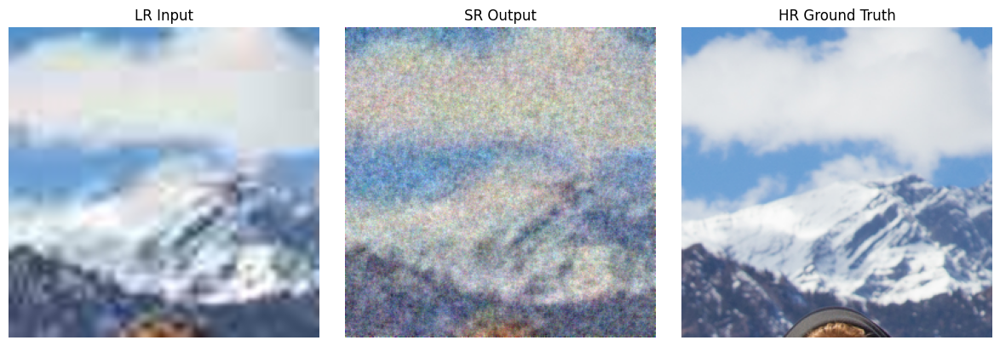

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_50_sample_2.png


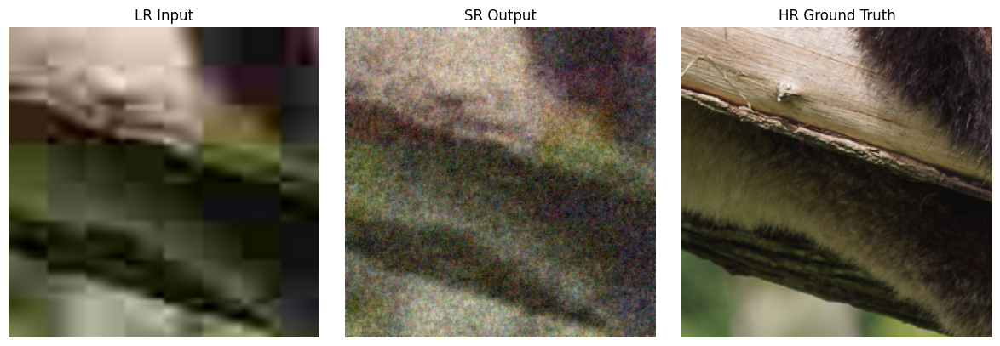

Saved visualization: /content/drive/MyDrive/Rezultati/epoch_50_sample_3.png


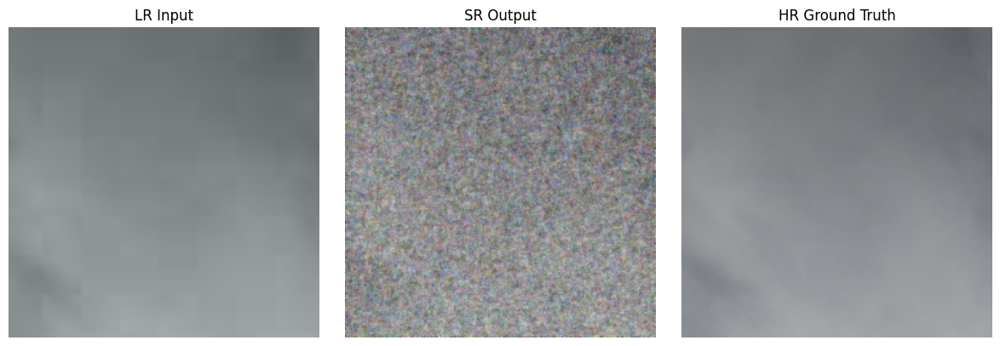

Metrics for epoch: 50 Mean PSNR: 19.782691955566406, Mean SSIM: 0.2525746524333954
Saved model weights at epoch 50


Epoch 51/100 | Train Loss: 0.0010 | Val Loss: 0.0017 | PSNR: 9.99 | SSIM: 0.0239


Epoch 52/100 | Train Loss: 0.0010 | Val Loss: 0.0008 | PSNR: 9.75 | SSIM: 0.0233


Epoch 53/100 | Train Loss: 0.0010 | Val Loss: 0.0019 | PSNR: 9.92 | SSIM: 0.0238


KeyboardInterrupt: 

In [ ]:
# --- Training Loop ---
print("Starting training...")
for epoch in range(epochs):

    train_bar = tqdm(train_dataset.take(steps_per_epoch), total=steps_per_epoch, desc="Training", leave=False)
    total_train_loss = 0

    for i, (lr_batch, hr_batch) in enumerate(train_bar):
        loss = train_step(hr_batch, lr_batch, model, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
        total_train_loss += loss

        train_bar.set_postfix(loss=float(loss))

    avg_train_loss = total_train_loss / steps_per_epoch

    # Validation
    total_val_loss = 0
    val_steps = 100
    val_bar = tqdm(valid_dataset.take(val_steps), total=val_steps, desc="Validation", leave=False)

    all_psnr, all_ssim = [], []

    for lr_batch, hr_batch in val_bar:
        val_loss = validation_step(hr_batch, lr_batch, model, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
        total_val_loss += val_loss

        sr_batch = sample(lr_batch, model, timesteps, sampling_steps=50)
        psnr_batch = tf.image.psnr(sr_batch, hr_batch, max_val=1.0)
        ssim_batch = tf.image.ssim(sr_batch, hr_batch, max_val=1.0)

        all_psnr.extend(psnr_batch.numpy())
        all_ssim.extend(ssim_batch.numpy())

        val_bar.set_postfix(val_loss=float(val_loss))

    avg_val_loss = total_val_loss / val_steps
    mean_psnr = np.mean(all_psnr)
    mean_ssim = np.mean(all_ssim)

    print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | PSNR: {mean_psnr:.2f} | SSIM: {mean_ssim:.4f}")

    if (epoch + 1) % 10 == 0:
        visualize_sample(model, train_dataset, timesteps, epoch=epoch, save_dir="/content/drive/MyDrive/Rezultati/")
        model.save_weights(f"/content/drive/MyDrive/Weights/model_weights_epoch_{epoch+1}.weights.h5")
        print(f"Saved model weights at epoch {epoch+1}")

In [ ]:
def evaluate_model(model, test_dataset, timesteps=1000, sampling_steps=1000, display_every_n=10):
    psnr_values = []
    ssim_values = []

    for i, (lr_img, hr_img) in enumerate(test_dataset):
        sr_img = sample(lr_img, model, timesteps=timesteps, sampling_steps=sampling_steps)

        for j in range(lr_img.shape[0]):  # loop over batch
            psnr = tf.image.psnr(sr_img[j], hr_img[j], max_val=1.0)
            ssim = tf.image.ssim(sr_img[j], hr_img[j], max_val=1.0)

            psnr_values.append(psnr.numpy())
            ssim_values.append(ssim.numpy())

            if (i * lr_img.shape[0] + j) % display_every_n == 0:
                plt.figure(figsize=(12, 4))
                plt.suptitle(f"Sample {i*lr_img.shape[0]+j} — PSNR: {psnr:.2f}, SSIM: {ssim:.4f}", fontsize=14)

                plt.subplot(1, 3, 1)
                plt.imshow(np.clip(lr_img[j].numpy(), 0, 1))
                plt.title("Low Resolution")
                plt.axis("off")

                plt.subplot(1, 3, 2)
                plt.imshow(np.clip(sr_img[j].numpy(), 0, 1))
                plt.title("Super Resolved")
                plt.axis("off")

                plt.subplot(1, 3, 3)
                plt.imshow(np.clip(hr_img[j].numpy(), 0, 1))
                plt.title("Ground Truth")
                plt.axis("off")

                plt.show()

    print(f"\n Test PSNR: {np.mean(psnr_values):.2f}, SSIM: {np.mean(ssim_values):.4f}")

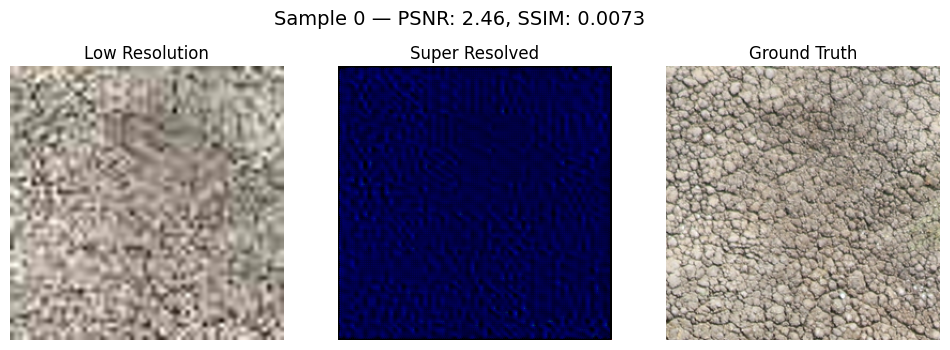

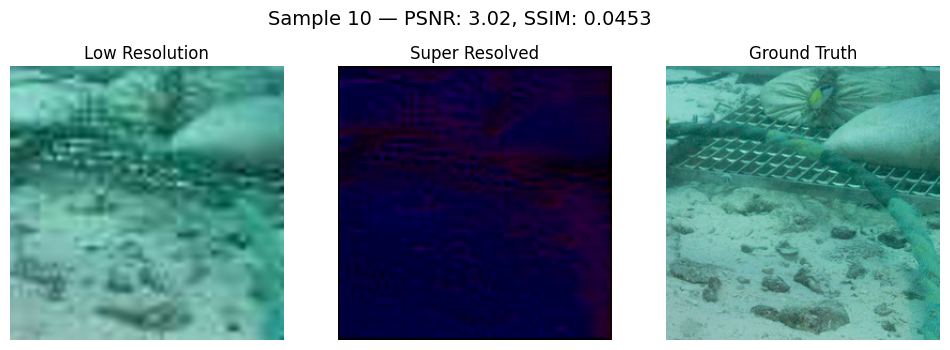

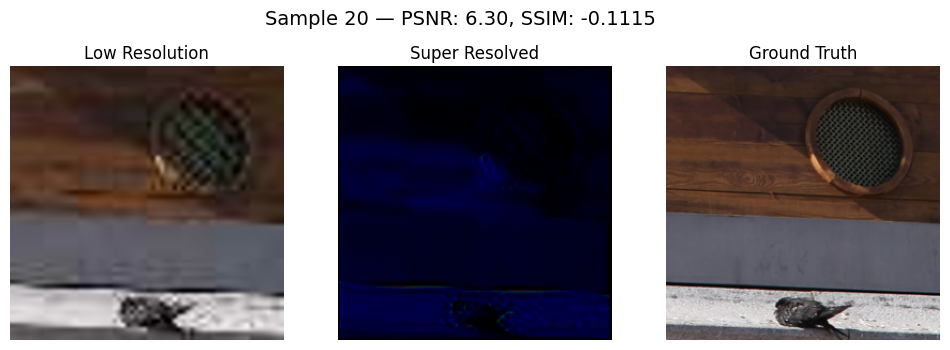

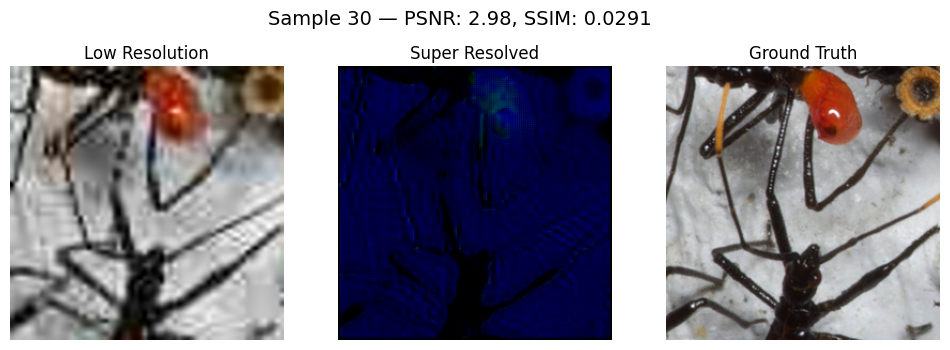

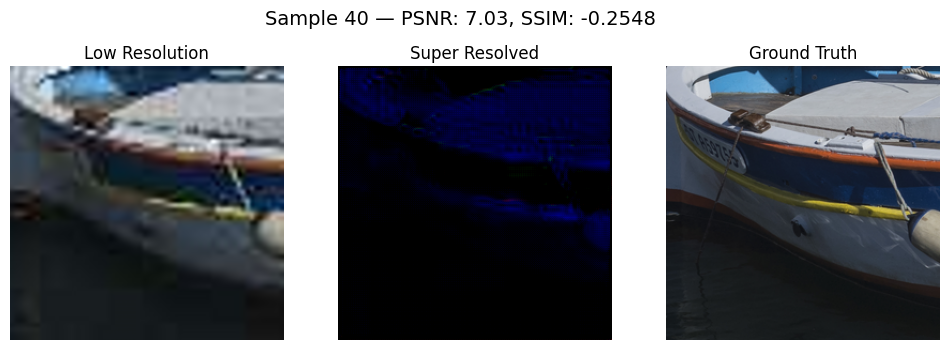

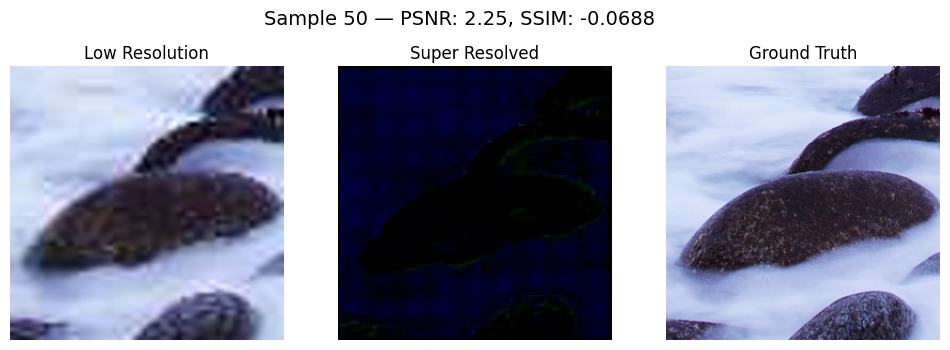

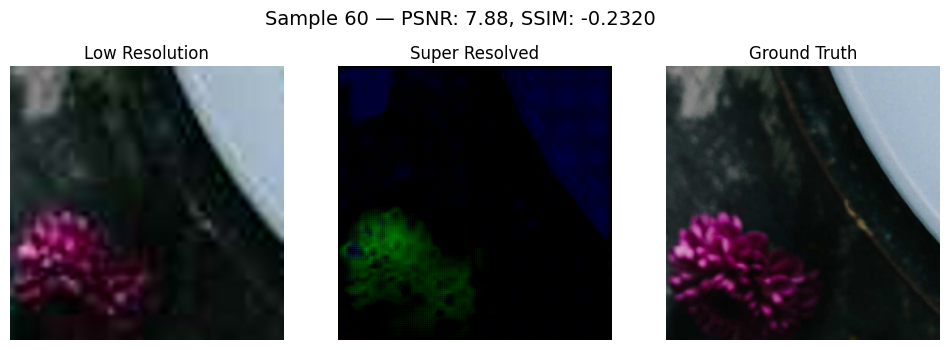

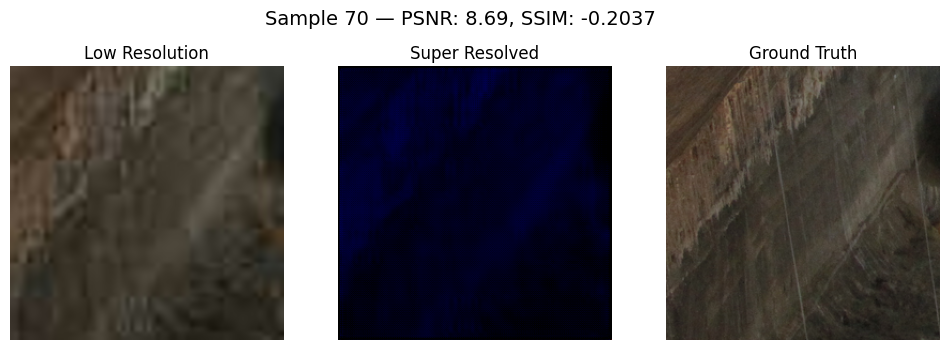

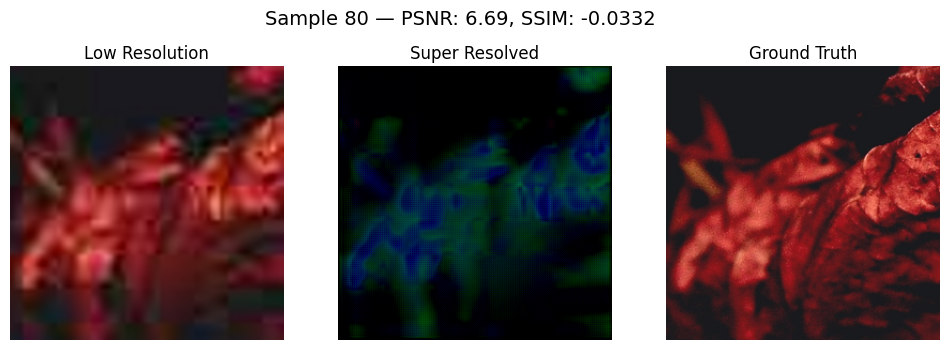

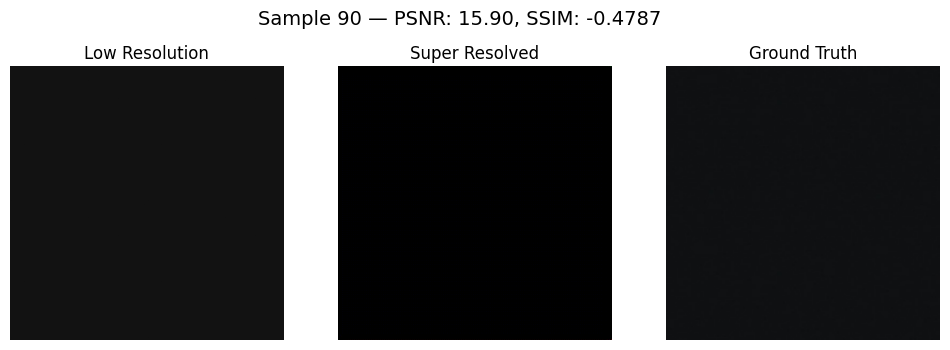


📊 Test PSNR: 4.77, SSIM: -0.0682


In [ ]:
evaluate_model(model, test_dataset)